In [2]:
import glob
import cv2
import numpy as np
import matplotlib.pyplot as plt

In [3]:
def read_one_image(filename):
    img = cv2.imread(filename)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    return (img, filename.split("./data/")[1])


def read_images(filename=None):
    filename = "./data/{}.jpeg".format(filename) if filename is not None else "./data/*.*"
    return [read_one_image(file) for file in glob.glob(filename)]


images = read_images()

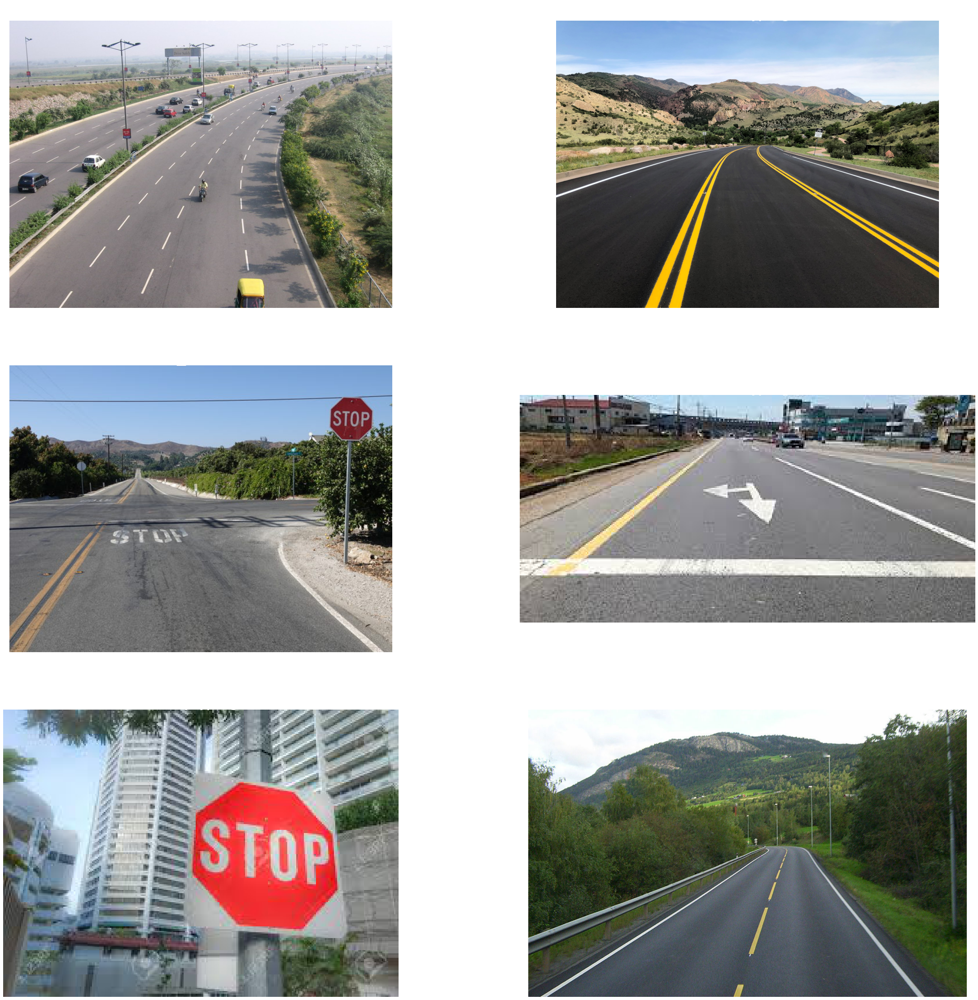

In [4]:

def show_images(images, title="", cmap=None):
    subplot_rows = 3 if len(images) > 1 else 1
    subplot_cols = 2 if len(images) > 1 else 1
    plt.subplots(subplot_rows, subplot_cols, figsize=(40, 40))
    for i, (img, filename) in enumerate(images):
        plt.subplot(subplot_rows, subplot_cols, i + 1)
        plt.axis("off")
        plt.title("{} {}".format(filename, title), fontsize=40, color='white')
        if cmap:
            plt.imshow(img, cmap)
        else:
            plt.imshow(img)


show_images(images)

In [5]:
def apply(images, fun, show=False, cmap=None, *args, **kwargs):
    new_images = [(fun(img, *args, **kwargs), filename) for (img, filename) in images]
    if show:
        show_images(new_images, cmap)
    return new_images

In [6]:

def gray_scale(image):
    return cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)


gray_images = apply(images, gray_scale, cmap='gray')

In [7]:
# def image_segmentation_using_k_means(image):
#     image = image.reshape((-1, 3))
#     image = np.float32(image)
#
#     criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 10, 1.0)
#     K = 3
#     attempts = 10
#
#     ret, label, center = cv2.kmeans(image, K, None, criteria, attempts, cv2.KMEANS_PP_CENTERS)
#     center = np.uint8(center)
#     res = center[label.flatten()]
#     result_image = res.reshape((image.shape))
#     return result_image
#
# #apply(images, image_segmentation_using_k_means)

In [8]:
# def image_segmentation_using_contours(image):
#     gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
#     _, thresh = cv2.threshold(gray, np.mean(gray), 255, cv2.THRESH_BINARY_INV)
#     edges = cv2.dilate(cv2.Canny(thresh, 0, 255), None)
#
#     cnt = sorted(cv2.findContours(edges, cv2.RETR_LIST, cv2.CHAIN_APPROX_SIMPLE)[-2], key=cv2.contourArea)[-1]
#     mask = np.zeros((256, 256), np.uint8)
#     masked = cv2.drawContours(mask, [cnt], -1, 255, -1)
#
#     dst = cv2.bitwise_and(image, image, mask=mask)
#     segmented = cv2.cvtColor(dst, cv2.COLOR_BGR2RGB)
#     return segmented
#
#
# apply(images, image_segmentation_using_contours)

In [9]:
# def filter_image(image, mask):
#     r = image[:,:,0] * mask
#     g = image[:,:,1] * mask
#     b = image[:,:,2] * mask
#     return np.dstack([r,g,b])
#
# def image_segmentation_using_otsu(image):
#     gray_img = gray_scale(image)
#     thresh = threshold_otsu()
#     img_otsu  = gray_img < thresh
#     return filter_image(image, img_otsu)
#
# apply(images, image_segmentation_using_otsu)


In [10]:
def image_segmentation_using_color_masking(image):
    hsv_img = cv2.cvtColor(image, cv2.COLOR_RGB2HSV)
    delta_low = 40
    delta_high = 20
    low_color = (124 + delta_low, 118 + delta_low, 120 + delta_low)
    high_color = (69 - delta_high, 82 - delta_high, 90 - delta_high)

    mask = cv2.inRange(hsv_img, high_color, low_color)
    result = cv2.bitwise_and(image, image, mask=mask)
    return result

In [11]:
def gaussian_blurring(image, kernel_size):
    return cv2.GaussianBlur(image, (kernel_size, kernel_size), cv2.BORDER_CONSTANT)

In [12]:
def canny_edge_detection(image):
    return cv2.Canny(image, 50, 120)

In [13]:
def crop_images(image, crop_ratio):
    curr_rows = image.shape[0]
    new_rows = int(curr_rows * crop_ratio)
    return image[new_rows:, :, :], new_rows

In [14]:
def dilation(image, kernel_size, iterations):
    return cv2.dilate(image, np.ones((kernel_size, kernel_size), np.uint8), iterations)

In [15]:
def thresholding(gray_image):
    ret, thresh1 = cv2.threshold(gray_image, 120, 255, cv2.THRESH_BINARY +
                                 cv2.THRESH_OTSU)
    return thresh1

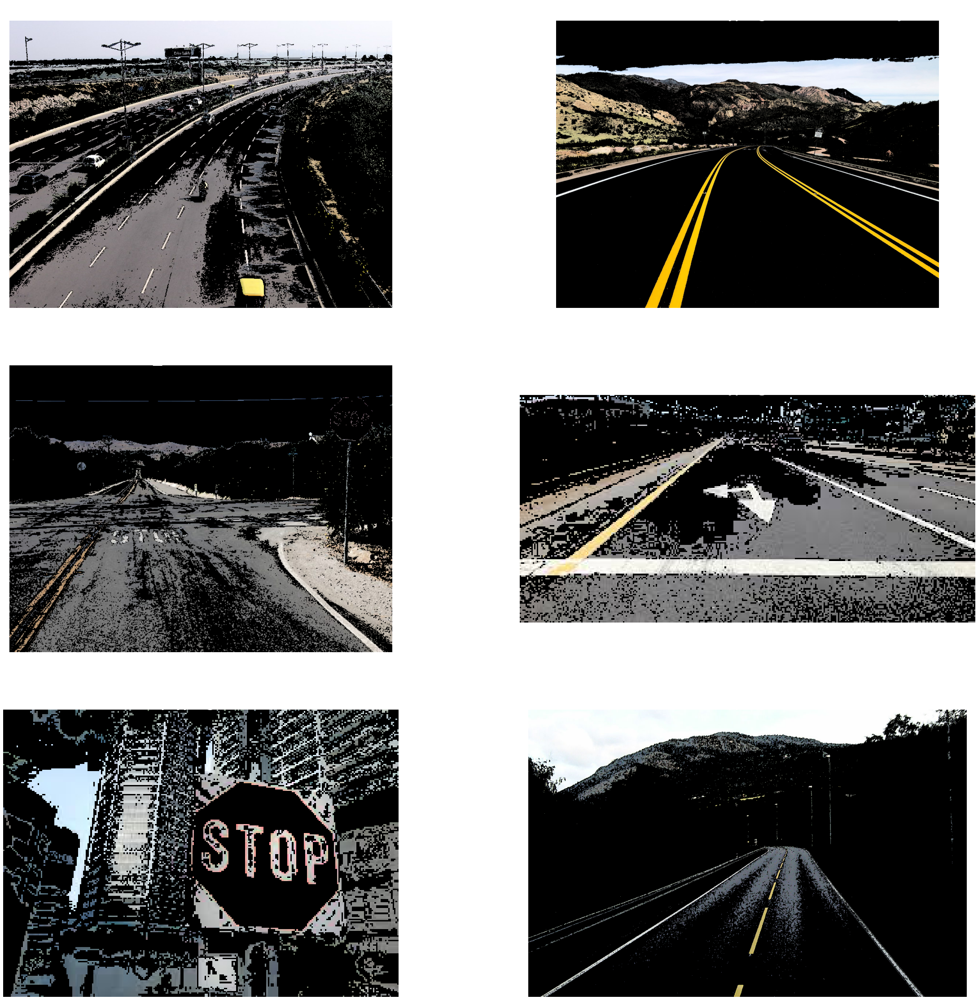

In [16]:
def rgb_color_mask(image):
    """
    Apply color selection to RGB images to blackout everything except for white and yellow lane lines.
        Parameters:
            image: An np.array compatible with plt.imshow.
    """
    #Gray color mask
    lower_threshold = np.uint8([50, 50, 110])
    upper_threshold = np.uint8([140, 140, 140])
    gray_mask = cv2.inRange(image, lower_threshold, upper_threshold)

    #White color mask
    lower_threshold = np.uint8([200, 200, 200])
    upper_threshold = np.uint8([255, 255, 255])
    white_mask = cv2.inRange(image, lower_threshold, upper_threshold)

    #Yellow color mask
    lower_threshold = np.uint8([171, 141, 0])
    upper_threshold = np.uint8([255, 255, 200])
    yellow_mask = cv2.inRange(image, lower_threshold, upper_threshold)

    #Combine white and yellow masks
    mask = cv2.bitwise_or(white_mask, yellow_mask)
    masked_image = cv2.bitwise_and(image, image, mask=mask)

    #Resultant mask
    mask = cv2.bitwise_or(mask, gray_mask)
    masked_image = cv2.bitwise_and(image, image, mask=mask)

    return masked_image


apply(read_images(), rgb_color_mask, show=True);

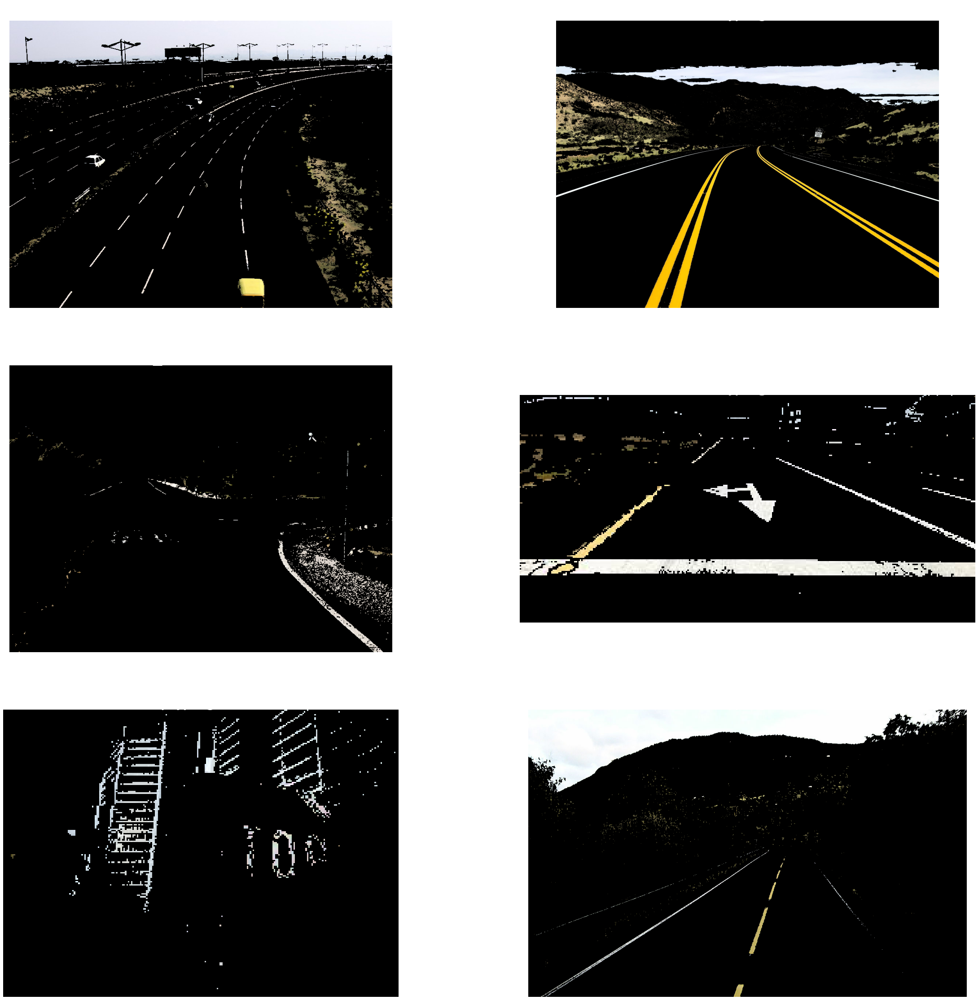

In [17]:
def hsv_color_mask(image):
    """
    Apply color selection to the HSV images to blackout everything except for white and yellow lane lines.
        Parameters:
            image: An np.array compatible with plt.imshow.
    """
    #Convert the input image to HSV
    converted_image = cv2.cvtColor(image, cv2.COLOR_RGB2HSV)

    #White color mask
    lower_threshold = np.uint8([0, 0, 210])
    upper_threshold = np.uint8([255, 30, 255])
    white_mask = cv2.inRange(converted_image, lower_threshold, upper_threshold)

    #Yellow color mask
    lower_threshold = np.uint8([18, 80, 80])
    upper_threshold = np.uint8([30, 255, 255])
    yellow_mask = cv2.inRange(converted_image, lower_threshold, upper_threshold)

    #Combine white and yellow masks
    mask = cv2.bitwise_or(white_mask, yellow_mask)
    masked_image = cv2.bitwise_and(image, image, mask=mask)

    return masked_image


apply(read_images(), hsv_color_mask, show=True);

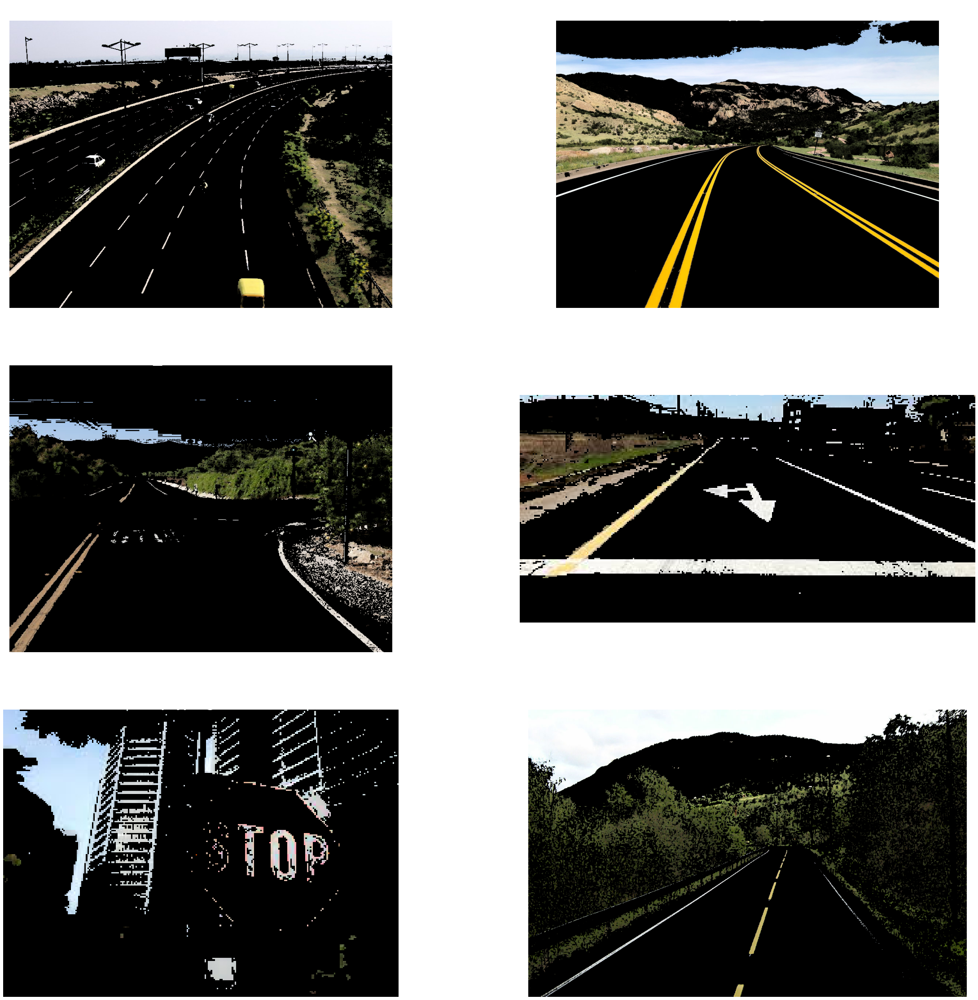

In [18]:
def hsl_color_mask(image):
    """
    Apply color selection to the HSL images to blackout everything except for white and yellow lane lines.
        Parameters:
            image: An np.array compatible with plt.imshow.
    """
    #Convert the input image to HSL
    converted_image = cv2.cvtColor(image, cv2.COLOR_RGB2HLS)

    #White color mask
    lower_threshold = np.uint8([0, 200, 0])
    upper_threshold = np.uint8([255, 255, 255])
    white_mask = cv2.inRange(converted_image, lower_threshold, upper_threshold)

    #Yellow color mask
    lower_threshold = np.uint8([10, 0, 45])
    upper_threshold = np.uint8([40, 255, 255])
    yellow_mask = cv2.inRange(converted_image, lower_threshold, upper_threshold)

    #Combine white and yellow masks
    mask = cv2.bitwise_or(white_mask, yellow_mask)

    #Exclusion colors
    # exclusion_colors = [
    #     ((25, 52, 72), (102, 255, 255))
    # ]
    # for ((lh, ls, ll), (hh, hs, hl)) in exclusion_colors:
    #     lower_threshold = np.uint8([lh, ls, ll])
    #     upper_threshold = np.uint8([hh, hs, hl])
    #     ex_mask = cv2.inRange(converted_image, lower_threshold, upper_threshold)
    #     ex_mask = 255 - ex_mask
    #     mask = cv2.bitwise_and(image, image, mask=ex_mask)
    #     plt.imshow(mask, cmap='gray')

    masked_image = cv2.bitwise_and(image, image, mask=mask)
    return masked_image


apply(read_images(), hsl_color_mask, show=True);

In [19]:

from sklearn.cluster import DBSCAN


def get_lines(houghLines):
    result_lines = []
    for line in houghLines:
        for rho, theta in line:
            deg_180 = np.pi
            if 0 < theta < deg_180 / 4:
                a = np.cos(theta)
                b = np.sin(theta)
                x0 = a * rho
                y0 = b * rho
                x1 = int(x0 + 1000 * (-b))
                y1 = int(y0 + 1000 * (a))
                x2 = int(x0 - 1000 * (-b))
                y2 = int(y0 - 1000 * (a))
                result_lines.append((x1, y1, x2, y2))

    return result_lines


def weighted_img(img, initial_img, α=0.8, β=1., λ=0.):
    return cv2.addWeighted(initial_img, α, img, β, λ)


def average_slope_intercept(lines):
    """
    Find the slope and intercept of the left and right lanes of each image.
        Parameters:
            lines: The output lines from Hough Transform.
    """
    left_lines = []  #(slope, intercept)
    left_weights = []  #(length,)
    right_lines = []  #(slope, intercept)
    right_weights = []  #(length,)

    for line in lines:
        for x1, y1, x2, y2 in line:
            if x1 == x2:
                continue
            slope = (y2 - y1) / (x2 - x1)
            intercept = y1 - (slope * x1)
            length = np.sqrt(((y2 - y1) ** 2) + ((x2 - x1) ** 2))
            if slope < 0:
                left_lines.append((slope, intercept))
                left_weights.append((length))
            else:
                right_lines.append((slope, intercept))
                right_weights.append((length))
    left_lane = np.dot(left_weights, left_lines) / np.sum(left_weights) if len(left_weights) > 0 else None
    right_lane = np.dot(right_weights, right_lines) / np.sum(right_weights) if len(right_weights) > 0 else None
    return left_lane, right_lane


def pixel_points(y1, y2, line):
    """
    Converts the slope and intercept of each line into pixel points.
        Parameters:
            y1: y-value of the line's starting point.
            y2: y-value of the line's end point.
            line: The slope and intercept of the line.
    """
    if line is None:
        return None
    slope, intercept = line
    x1 = int((y1 - intercept) / max(0.1, slope))
    x2 = int((y2 - intercept) / max(0.1, slope))
    y1 = int(y1)
    y2 = int(y2)
    return ((x1, y1), (x2, y2))


def lane_lines(image, lines):
    """
    Create full lenght lines from pixel points.
        Parameters:
            image: The input test image.
            lines: The output lines from Hough Transform.
    """
    left_lane, right_lane = average_slope_intercept(lines)
    y1 = image.shape[0]
    y2 = y1 * 0.6
    left_line = pixel_points(y1, y2, left_lane)
    right_line = pixel_points(y1, y2, right_lane)
    return left_line, right_line


def draw_lane_lines(image, lines, color=[255, 0, 0], thickness=12):
    """
    Draw lines onto the input image.
        Parameters:
            image: The input test image.
            lines: The output lines from Hough Transform.
            color (Default = red): Line color.
            thickness (Default = 12): Line thickness.
    """
    line_image = np.zeros_like(image)
    for line in lines:
        if line is not None:
            cv2.line(line_image, *line, color, thickness)
    return cv2.addWeighted(image, 1.0, line_image, 1.0, 0.0)


def hough_transform(orig_image, masked_image):
    # Apply HoughLinesP method to
    # to directly obtain line end points
    # lines = cv2.HoughLinesP(
    #     masked_image,  # Input edge image
    #     1,  # Distance resolution in pixels
    #     np.pi / 180,  # Angle resolution in radians
    #     threshold=100,  # Min number of votes for valid line
    #     minLineLength=50,  # Min allowed length of line
    #     maxLineGap=30  # Max allowed gap between line for joining them
    # )
    #
    # if lines is None or len(lines) == 0:
    #     return orig_image, 0
    #
    #
    #
    # for points in lines:
    #     x1, y1, x2, y2 = points[0]
    #     y1 += new_rows
    #     y2 += new_rows
    #     cv2.line(orig_image, (x1, y1), (x2, y2), (0, 255, 0), 2)
    #     # Maintain a simples lookup list for points
    #     lines_list.append([(x1, y1), (x2, y2)])

    # rho_resolution = 1
    # theta_resolution = np.pi/180
    # threshold = 155
    #
    # hough_lines_image = cv2.HoughLines(masked_image, rho_resolution , theta_resolution , threshold)
    #
    # if hough_lines_image is None or len(hough_lines_image) == 0:
    #     return orig_image, 0
    # lines = get_lines(hough_lines_image)
    # for (x1, y1, x2, y2) in lines:
    #     y1 += new_rows
    #     y2 += new_rows
    #     cv2.line(orig_image, (x1, y1), (x2, y2), (0, 255, 0), 2)
    #     lines_list.append([(x1, y1), (x2, y2)])

    rho = 1  #Distance resolution of the accumulator in pixels.
    theta = np.pi / 180  #Angle resolution of the accumulator in radians.
    threshold = 50  #Only lines that are greater than threshold will be returned.
    minLineLength = 100  #Line segments shorter than that are rejected.
    maxLineGap = 50  #Maximum allowed gap between points on the same line to link them
    hough_lines = cv2.HoughLinesP(masked_image, rho=rho, theta=theta, threshold=threshold,
                                  minLineLength=minLineLength, maxLineGap=maxLineGap)

    #hough_lines = np.squeeze(hough_lines, axis=1)
    hough_lines = hough_lines.reshape(hough_lines.shape[0], 4)

    lines_list = []
    image = np.copy(orig_image)

    if hough_lines is None:
        return image, len(lines_list)

    lines_list = []
    slopes = []
    intercepts = []

    for x1, y1, x2, y2 in hough_lines:
        slope = (y2 - y1) / (x2 - x1)
        slopes.append(slope)
        intercepts.append(y1 - (slope * x1))


    # from sklearn.preprocessing import MinMaxScaler
    # from sklearn.cluster import DBSCAN
    # #preprocessing features to be in (0-1) range
    # scaler = MinMaxScaler()
    # scaler.fit(hough_lines)
    # hough_lines = scaler.fit_transform(hough_lines)
    #
    # db = DBSCAN(eps=0.05, min_samples=12).fit(hough_lines) #applying DBSCAN Algorithm on our normalized lines
    # hough_lines = scaler.inverse_transform(hough_lines) #getting back our original values

    #preprocessing features to be in (0-1) range
    from sklearn.preprocessing import MinMaxScaler
    from sklearn.cluster import KMeans
    #scaler = MinMaxScaler()
    #scaler.fit(hough_lines)
    #hough_lines = scaler.fit_transform(hough_lines)

    #checking K-Means Clustering Algorithm performance
    n_clusters=20
    if len(hough_lines) > n_clusters:
        # kmeans = KMeans(n_clusters=n_clusters)
        # kmeans.fit(np.reshape(slopes, (-1,1)))
        # slopes = kmeans.cluster_centers_
        #
        # kmeans.fit(np.reshape(intercepts, (-1,1)))
        # intercepts = kmeans.cluster_centers_

        db = DBSCAN(eps=0.05, min_samples=5).fit(hough_lines) #applying DBSCAN Algorithm on our normalized lines
        labels = db.labels_

        #lines = scaler.inverse_transform(lines)

    #hough_lines = scaler.inverse_transform(hough_lines) #getting back our original values
    #centroids = scaler.inverse_transform(centroids) #scaling centroids to be similiar to our original lines

    def sort_lines_by_slope(l1, s):
        (x11, y11, x12, y12) = l1
        s1 = (y12 - y11) / (x12 - x11)
        return s1 < s

    # for (slope, intercept) in zip(slopes, intercepts):
    #     sorted_hough_lines = sorted(hough_lines, key=lambda l: sort_lines_by_slope(l, slope))
    #     #(x1, y1, x2, y2) = sorted_hough_lines
    #     x1, y1, x2, y2 = sorted_hough_lines[0].astype(int)
    #     cv2.line(image, (x1, y1), (x2, y2), [255, 0, 0], 2)
    #     lines_list.append([(x1, y1), (x2, y2)])

    for line in labels:
        #sorted_hough_lines = sorted(hough_lines, key=lambda l: sort_lines_by_slope(l, slope))
        #(x1, y1, x2, y2) = sorted_hough_lines
        x1, y1, x2, y2 = line
        cv2.line(image, (x1, y1), (x2, y2), [255, 0, 0], 2)
        lines_list.append([(x1, y1), (x2, y2)])

    return image, len(lines_list)
    #return draw_lane_lines(image, lane_lines(image, hough_lines)), len(lines_list)


def region_selection(image):
    """
    Determine and cut the region of interest in the input image.
        Parameters:
            image: An np.array compatible with plt.imshow.
    """
    mask = np.zeros_like(image)
    #Defining a 3 channel or 1 channel color to fill the mask with depending on the input image
    if len(image.shape) > 2:
        channel_count = image.shape[2]
        ignore_mask_color = (255,) * channel_count
    else:
        ignore_mask_color = 255
    #We could have used fixed numbers as the vertices of the polygon,
    #but they will not be applicable to images with different dimesnions.
    rows, cols = image.shape[:2]
    bottom_left = [cols * 0, rows * 1]
    top_left = [cols * 0, rows * 0.40]
    bottom_right = [cols * 1, rows * 1]
    top_right = [cols * 1, rows * 0.40]
    vertices = np.array([[bottom_left, top_left, top_right, bottom_right]], dtype=np.int32)
    cv2.fillPoly(mask, vertices, ignore_mask_color)
    masked_image = cv2.bitwise_and(image, mask)
    return masked_image


# Pipeline
def apply_pipeline(images, dilation_kernel_size, blurring_kernel_size, is_direct=False):
    new_images = []
    for (image, filename) in images:
        line_count = 0
        if is_direct:
            new_image = gaussian_blurring(image)
            new_image = image_segmentation_using_color_masking(new_image)

        else:
            #new_image, new_rows = crop_images(image, crop_ratio=0.6)
            #new_image = image
            #new_image = rgb_color_mask(image)
            #new_image = hsv_color_mask(image)
            new_image = hsl_color_mask(image)
            new_image = gray_scale(new_image)
            new_image = gaussian_blurring(new_image, blurring_kernel_size)
            #new_image = dilation(new_image, kernel_size=dilation_kernel_size, iterations=10)
            new_image = cv2.Canny(new_image, 230, 255)
            new_image = region_selection(new_image)
            #new_image = thresholding(new_image)
            new_image, line_count = hough_transform(image, new_image)

        new_images.append((new_image, "{} {}".format(filename, line_count)))

    title = "Dilation={}, Blur={}".format(dilation_kernel_size, blurring_kernel_size)
    #show_images(new_images, title=title)
    show_images(new_images, title=title, cmap='gray')


def apply_kernels(images, max_dilation_kernel_size, max_blurring_kernel_size):
    for dil_ker in range(1, max_dilation_kernel_size + 1):
        for blurr_ker in range(1, max_blurring_kernel_size + 1):
            try:
                #print("Using {} dilation kernel and {} blur kernel".format(dil_ker, blurr_ker))
                apply_pipeline(images, dil_ker, blurr_ker)
                #print("=============================")
            except:
                continue


apply_pipeline(read_images(), dilation_kernel_size=2, blurring_kernel_size=5)
#apply_kernels(read_images(), max_dilation_kernel_size=2, max_blurring_kernel_size=7)

TypeError: cannot unpack non-iterable numpy.int64 object